In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format='retina'

In [3]:
data = np.load('Run_022018/bolp_20p0_um_0_wider.npz')

In [4]:
data.files

['i', 'func_all', 'param']

In [6]:
data['i'][::200]

array([0, 1, 2, 3, 4, 5, 6])

In [9]:
data['func_all'][:200]

array([[  6.57484800e-03,   5.92956771e+02,   4.67298607e+02, ...,
          7.78725227e-05,   7.78725227e-05,   4.86703267e-05],
       [  6.54310400e-03,   5.58647027e+02,   4.43030110e+02, ...,
          1.27156775e-04,   9.78129035e-05,   1.07594194e-04],
       [  6.54777600e-03,   5.15466587e+02,   4.09861377e+02, ...,
          2.93229335e-05,   5.86458669e-05,   1.95486223e-05],
       ..., 
       [  6.53113600e-03,   5.14924698e+02,   3.93859632e+02, ...,
          1.17590569e-04,   6.85944987e-05,   4.89960705e-05],
       [  6.49990400e-03,   4.55860180e+02,   3.44427512e+02, ...,
          1.08309292e-04,   9.84629927e-05,   3.93851971e-05],
       [  6.55974400e-03,   5.50661509e+02,   4.31619269e+02, ...,
          7.80518264e-05,   7.80518264e-05,   9.75647830e-05]])

In [17]:
def poly(x,a,b,c,d):
    return a*x**3+b*x**2+c*x+d

In [29]:
alpha_0 = 1.143850075933713

In [33]:
def fit_poly_derivative(param,func):
    a,b,c,d = np.polyfit(param,func,3)
    plt.figure()
    plt.plot(param,func,'b.')
    plt.plot(np.linspace(1.03,1.26,100),poly(np.linspace(1.03,1.26,100),a,b,c,d),'r-')
    return 3*a*alpha_0**2+2*b*alpha_0+c

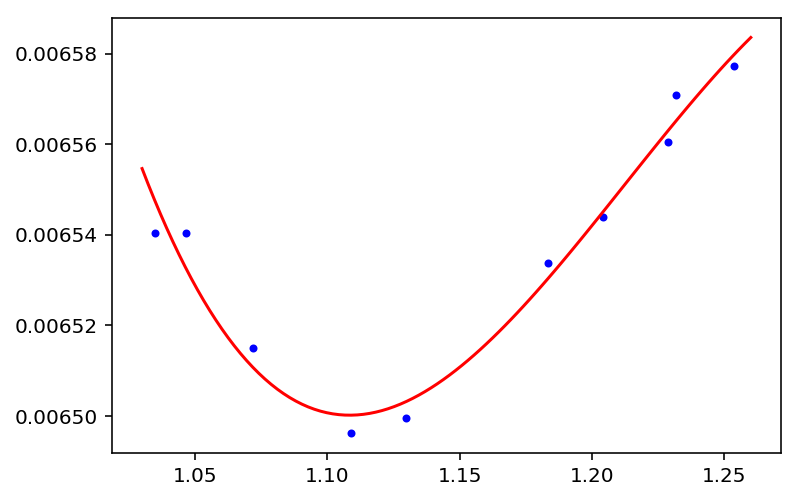

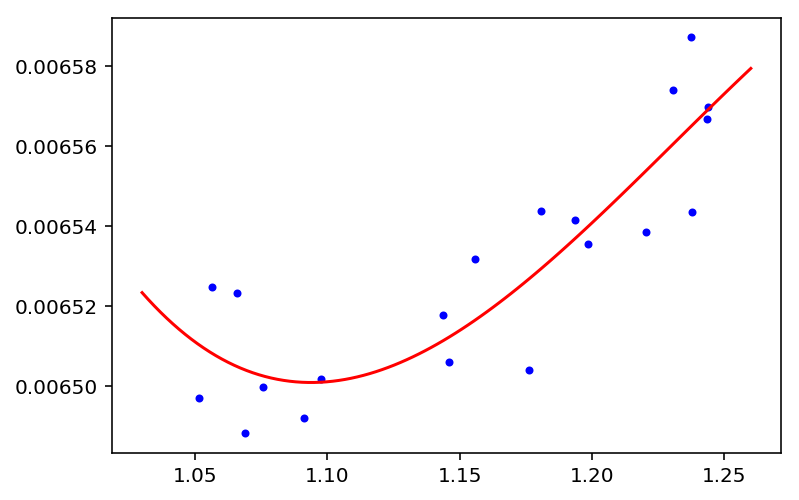

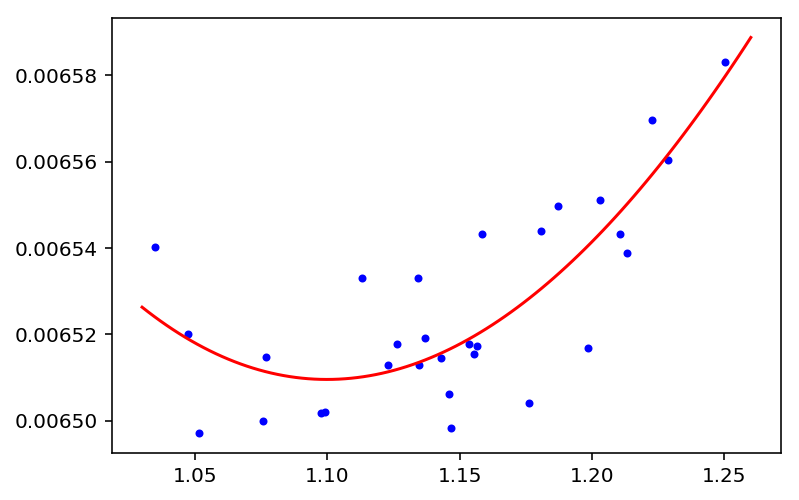

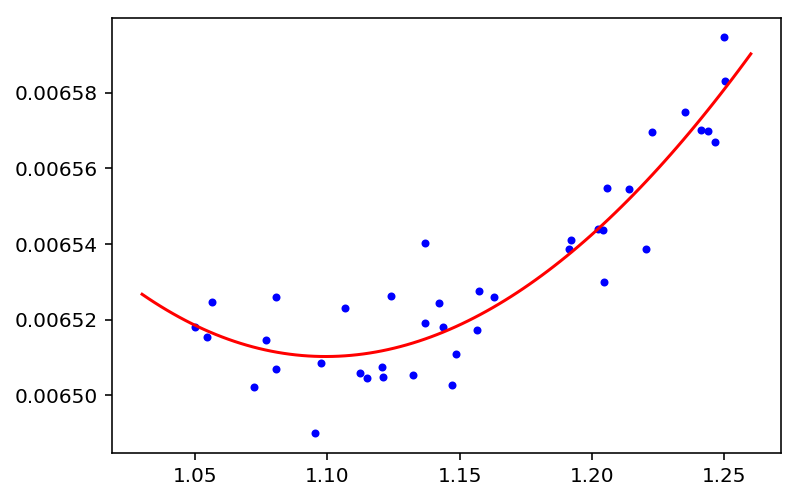

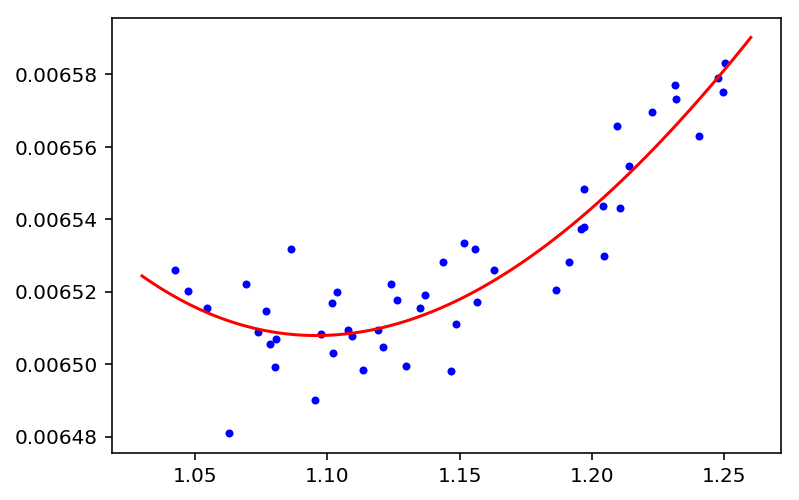

...

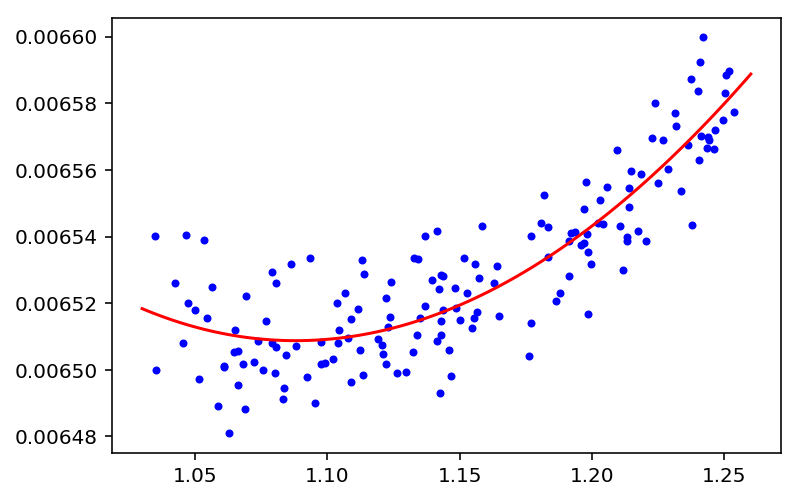

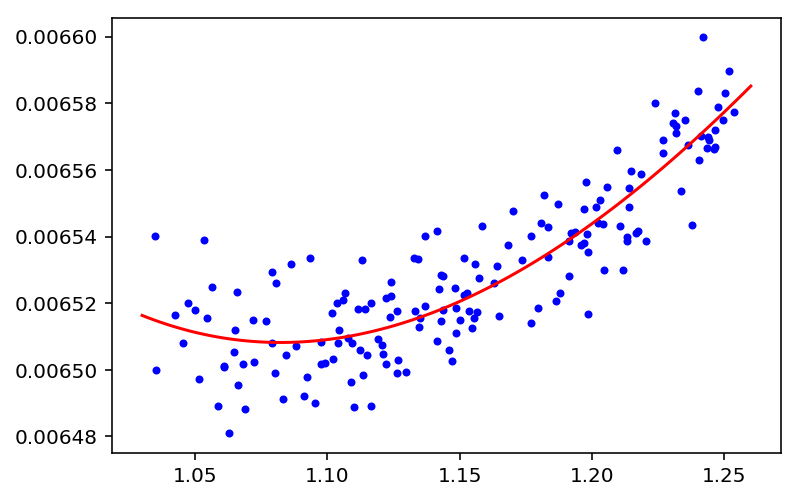

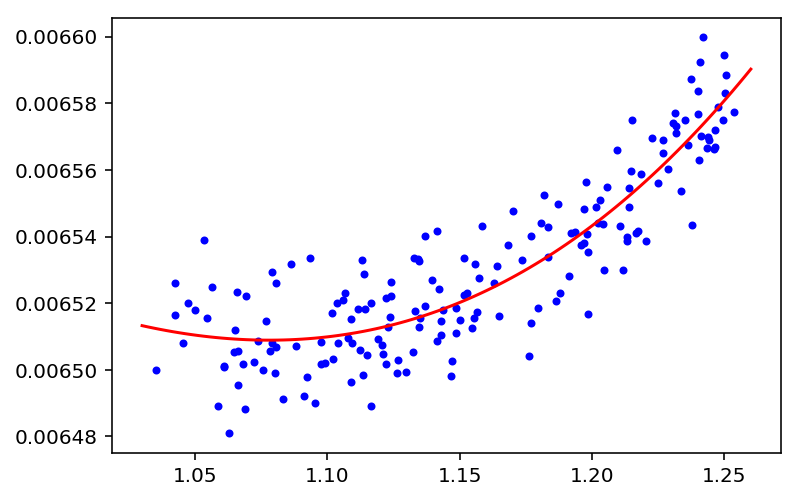

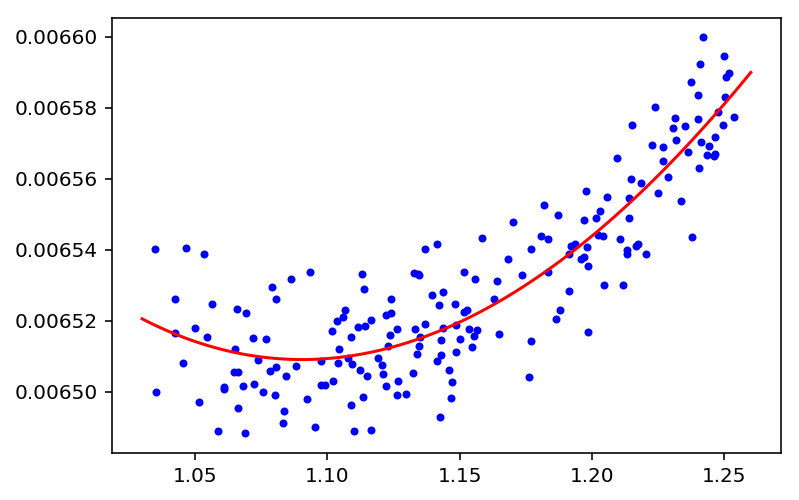

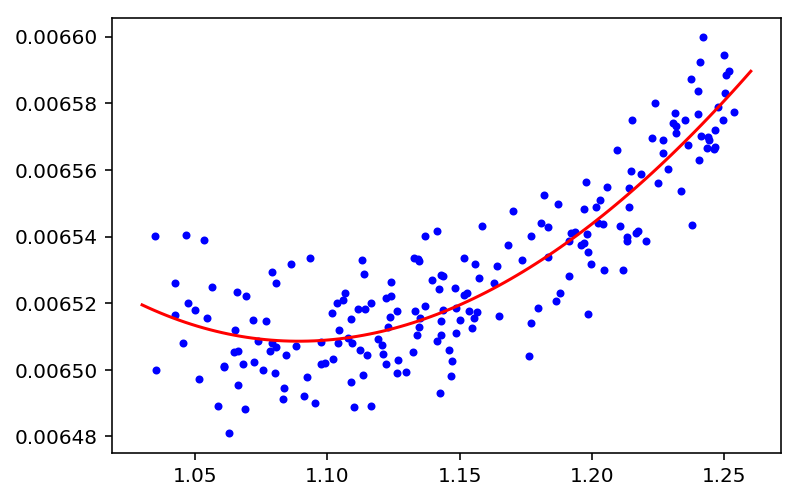

In [40]:
poly_deriv = []
for i in range(20):
    idx = np.random.choice(200,(10+10*i),replace=0)
    param_i = data['param'][idx,0]
    func_i = data['func_all'][idx,0]
    poly_deriv.append(fit_poly_derivative(param_i,func_i))

In [21]:
narrow = np.load('Run_022018/bolp_20p0_um_0.npz')

In [22]:
narrow.files

['i', 'func_all', 'param']

In [26]:
narrow['i'][::1000]

array([0, 1, 2, 3, 4, 5, 6])

In [41]:
def fit_line_derivative(param,func):
    a,b = np.polyfit(param,func,1)
    plt.figure()
    plt.plot(param,func,'b.')
    plt.plot(np.linspace(1.1,1.2,100),np.linspace(1.1,1.2,100)*a+b,'r-')
    return a,b

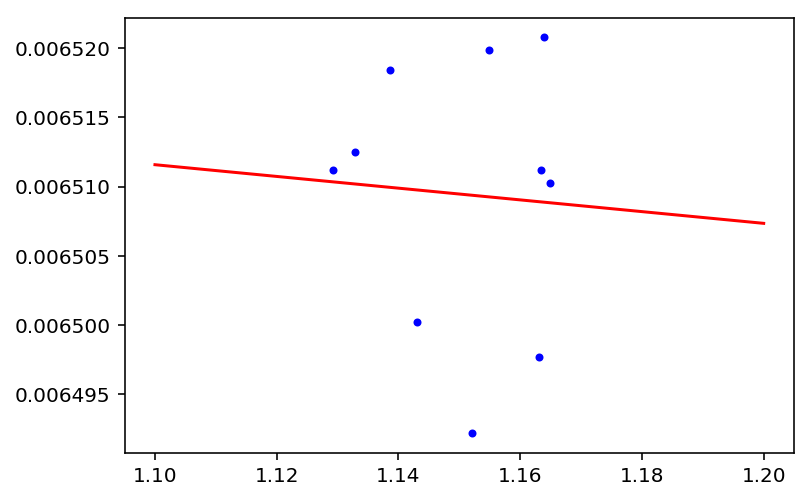

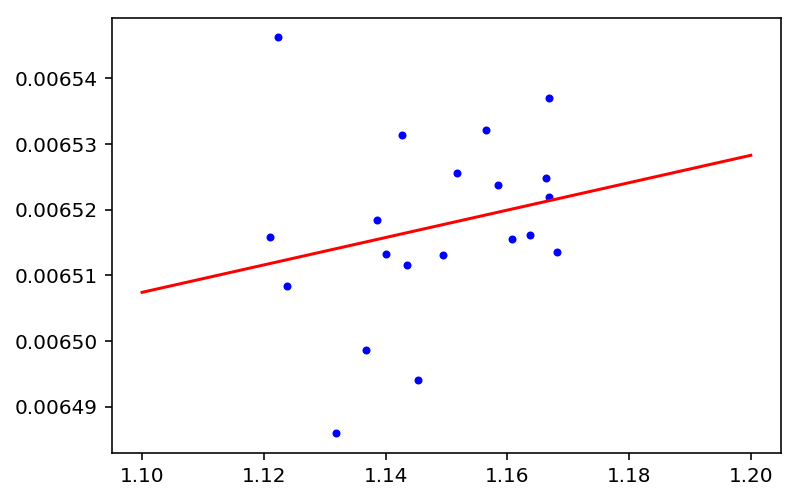

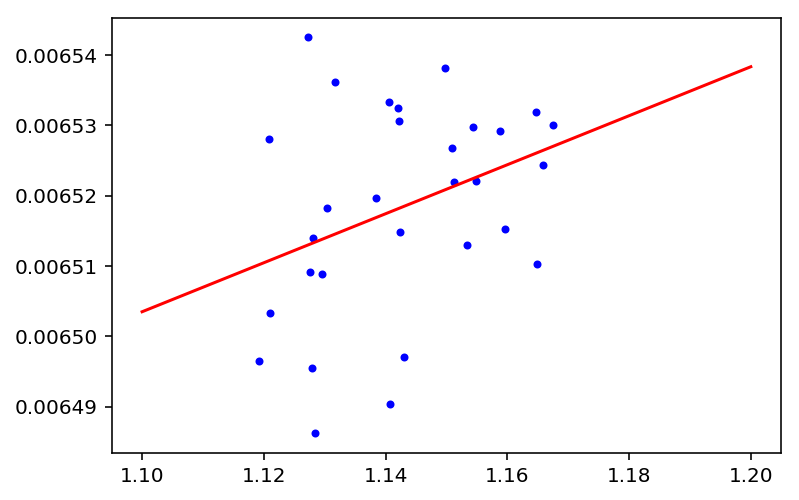

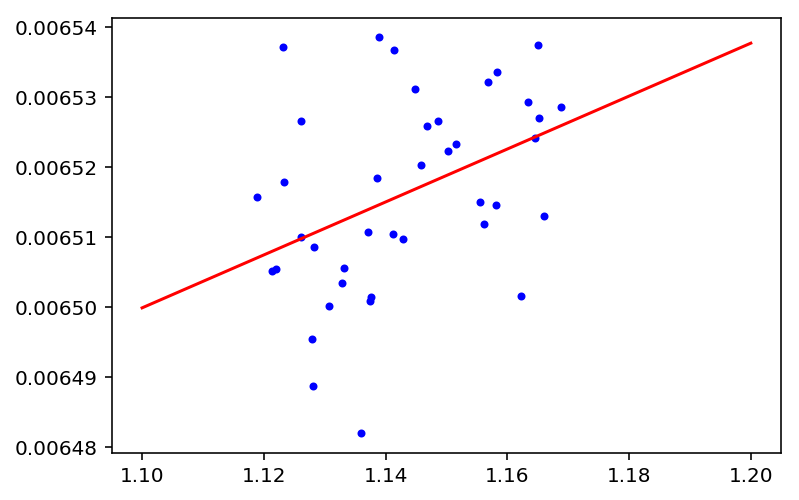

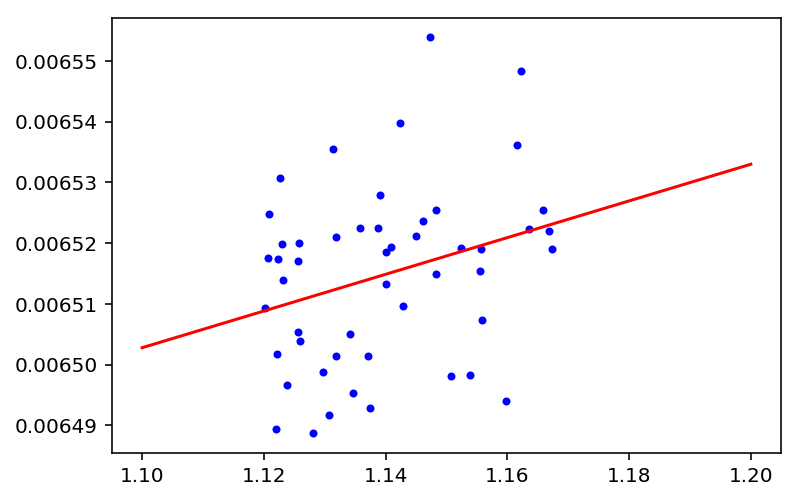

...

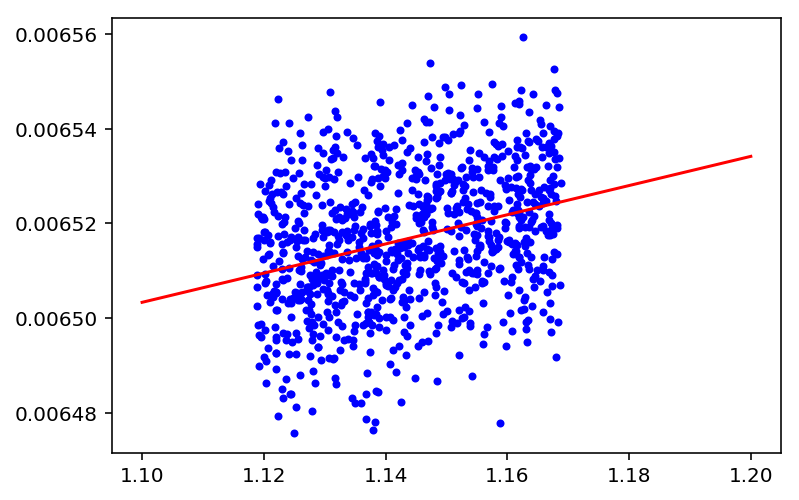

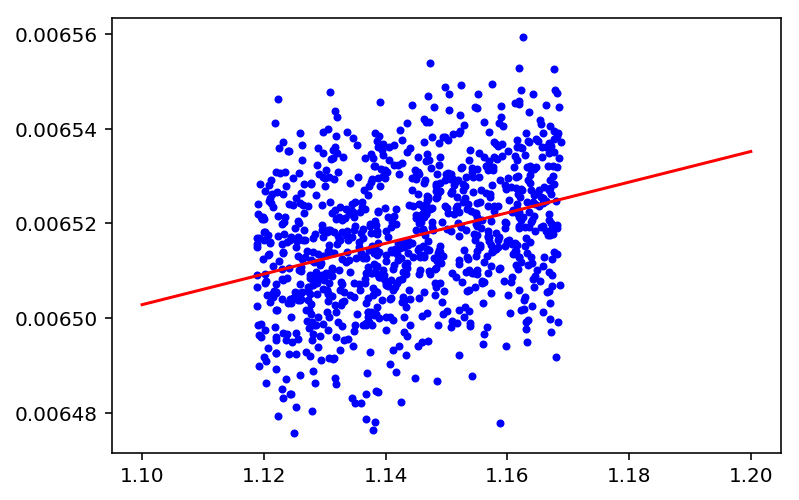

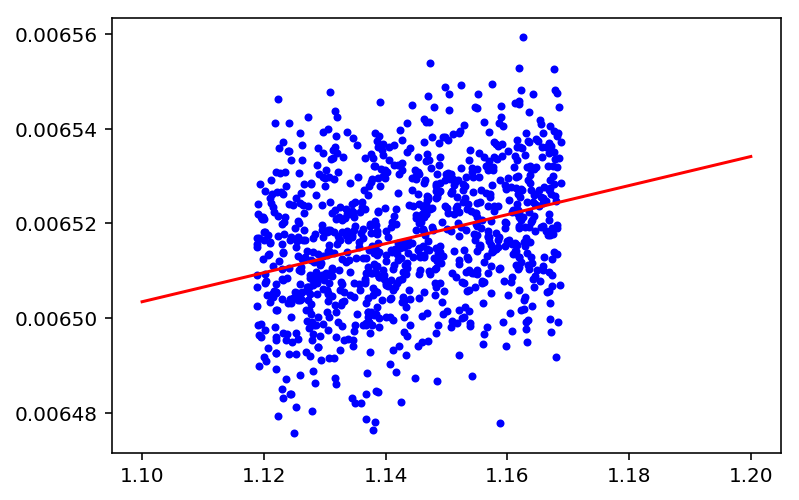

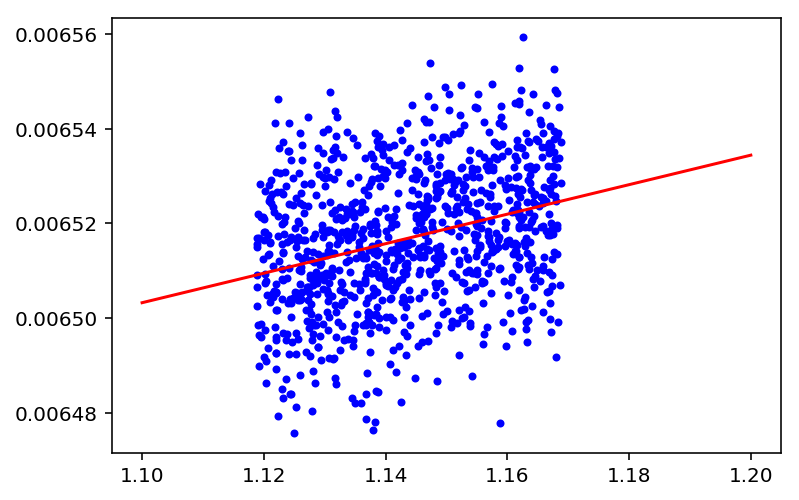

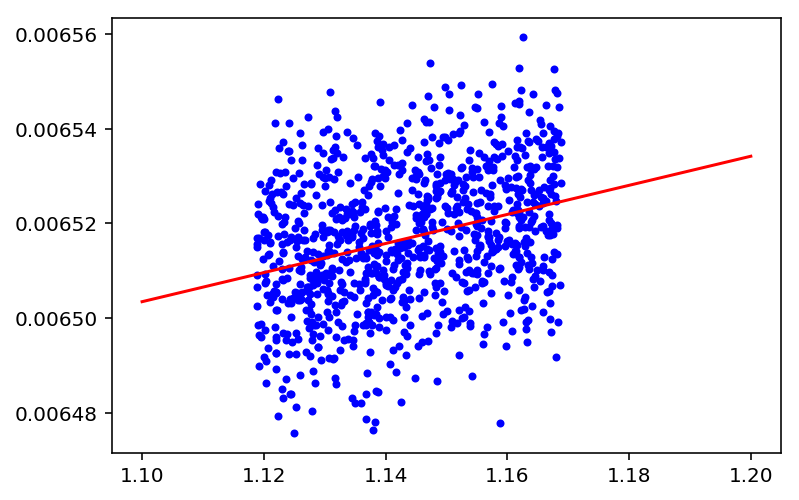

In [42]:
line_deriv = []
for i in range(100):
    idx = np.random.choice(1000,(10+10*i),replace=0)
    param_i = narrow['param'][idx,0]
    func_i = narrow['func_all'][idx,0]
    line_deriv.append(fit_line_derivative(param_i,func_i))

In [47]:
import halotools

from halotools.sim_manager import  CachedHaloCatalog

halocat = CachedHaloCatalog(simname='bolplanck',version_name='halotools_v0p4',redshift=0,halo_finder='rockstar')

from HOD_models import decorated_hod_model


model = decorated_hod_model()

model.populate_mock(halocat)

In [48]:
fidp = np.array([1.143850075933713, 13.2858403826148, 0.34846490317343715, 11.30750270046123, 11.971857028175842, 0.0, 0.0])

In [49]:
param_names = ('alpha','logM1','sigma_logM','logM0','logMmin','mean_occupation_centrals_assembias_param1','mean_occupation_satellites_assembias_param1')

In [50]:
model.param_dict.update(dict(zip(param_names, fidp)))

In [51]:
model.param_dict

{'alpha': 1.1438500759337129,
 'logM0': 11.30750270046123,
 'logM1': 13.285840382614801,
 'logMmin': 11.971857028175842,
 'mean_occupation_centrals_assembias_param1': 0.0,
 'mean_occupation_satellites_assembias_param1': 0.0,
 'sigma_logM': 0.34846490317343715}

In [80]:
Acen_0 = 0.

In [59]:
alpha = []
ngal = []
for i in range(100):
    print i
    alphai = alpha_0+np.random.random()*0.2-0.1
    alpha.append(alphai)
    model.param_dict['alpha'] = alphai
    ngal.append((np.sum(model.mean_occupation_centrals(table=model.mock.halo_table))+\
                np.sum(model.mean_occupation_satellites(table=model.mock.halo_table)))/(250.**3))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [72]:
alpha_l = []
ngal_l = []
for i in range(100):
    print i
    alphai = alpha_0-0.025+0.0005*i
    alpha_l.append(alphai)
    model.param_dict['alpha'] = alphai
    ngal_l.append((np.sum(model.mean_occupation_centrals(table=model.mock.halo_table))+\
                np.sum(model.mean_occupation_satellites(table=model.mock.halo_table)))/(250.**3))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


0.000302619939994


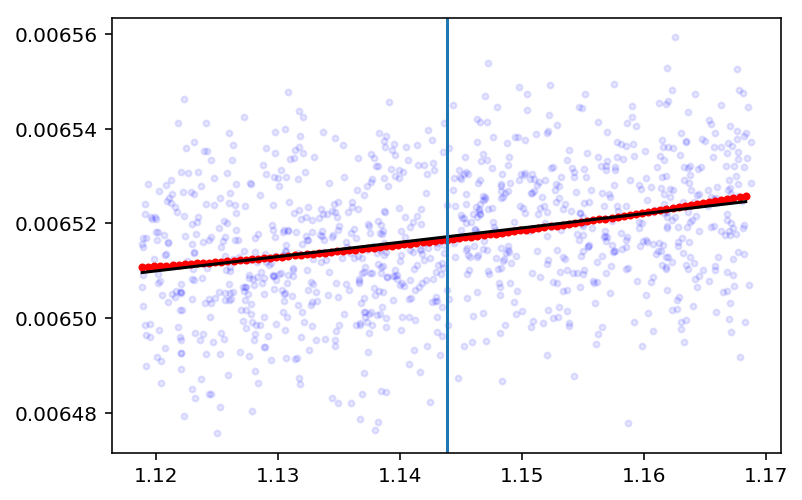

In [77]:
plt.plot(narrow['param'][:1000,0],narrow['func_all'][:1000,0],'b.',alpha=0.1)
plt.plot(alpha_l,ngal_l,'r.')
A,B = np.polyfit(alpha_l,ngal_l,1)
plt.plot(np.sort(alpha_l),np.sort(np.array(alpha_l))*A+B,'k-')
print A
plt.axvline(alpha_0)

0.000304191606195


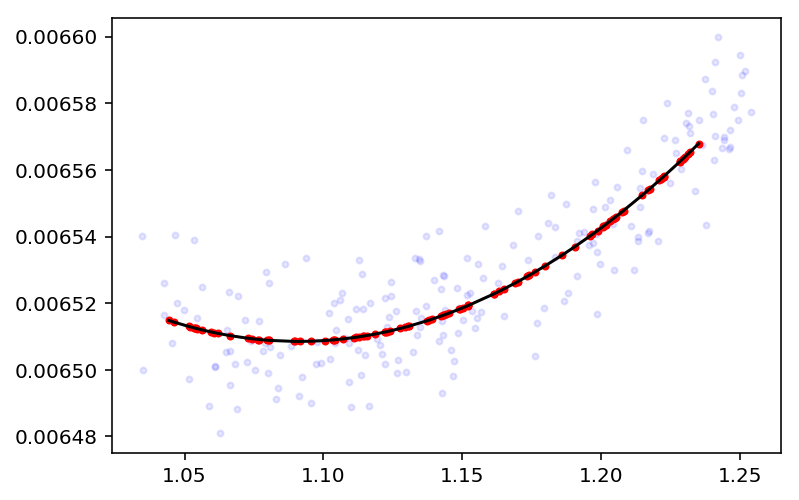

In [67]:
plt.plot(data['param'][:200,0],data['func_all'][:200,0],'b.',alpha=0.1)
plt.plot(alpha,ngal,'r.')
a,b,c,d = np.polyfit(alpha,ngal,3)
plt.plot(np.sort(alpha),poly(np.sort(np.array(alpha)),a,b,c,d),'k-')
print 3*a*alpha_0**2+2*b*alpha_0+c

(0.0002, 0.0004)

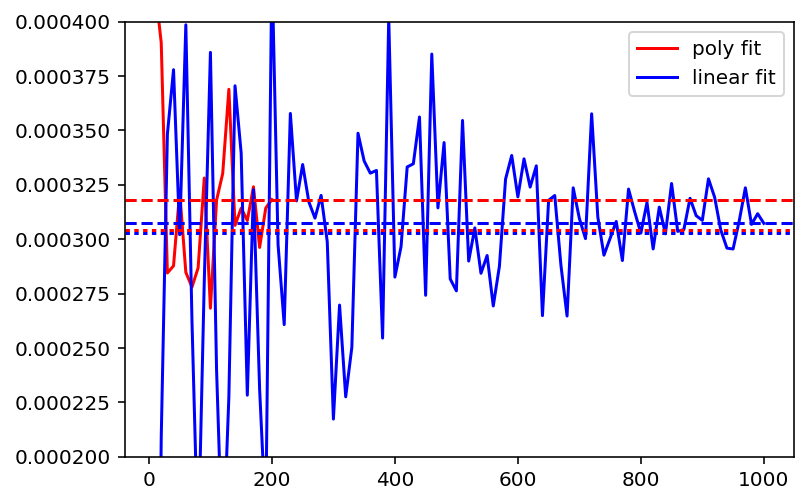

In [78]:
plt.plot(np.arange(1,21)*10,poly_deriv,'r',label='poly fit')
plt.plot(np.arange(1,101)*10,line_deriv,'b',label='linear fit')
plt.axhline(poly_deriv[-1],linestyle='--',c='r')
plt.axhline(line_deriv[-1],linestyle='--',c='b')
plt.axhline(0.000304191606195,linestyle=':',c='r')
plt.axhline(0.000302619939994,linestyle=':',c='b')
plt.legend()
plt.ylim((0.0002,0.0004))

In [95]:
def fit_poly_derivative_Acen(param,func):
    a,b,c,d = np.polyfit(param,func,3)
    plt.figure()
    plt.plot(param,func,'b.')
    plt.plot(np.linspace(-1,1,100),poly(np.linspace(-1,1,100),a,b,c,d),'r-')
    return 3*a*Acen_0**2+2*b*Acen_0+c

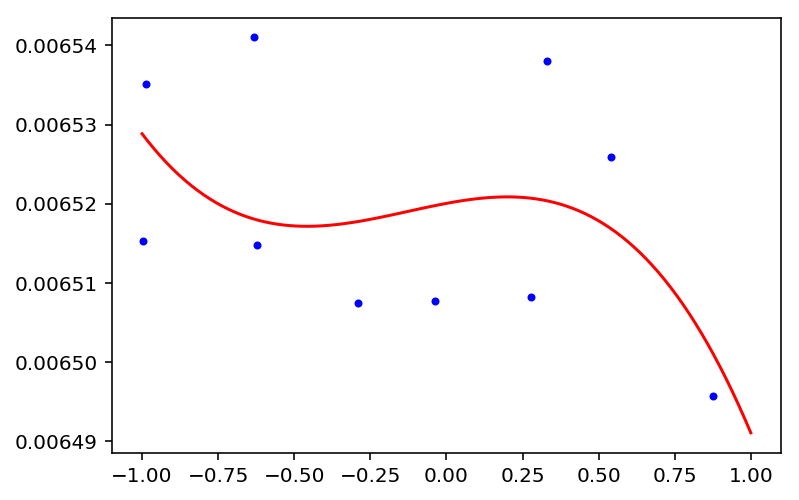

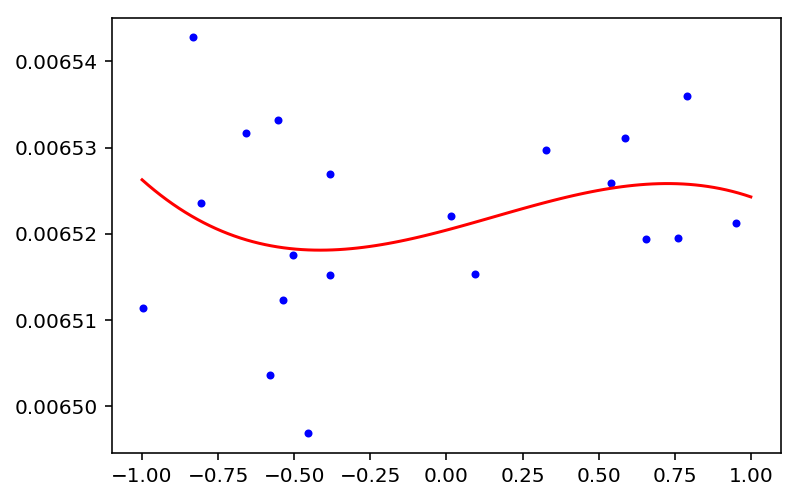

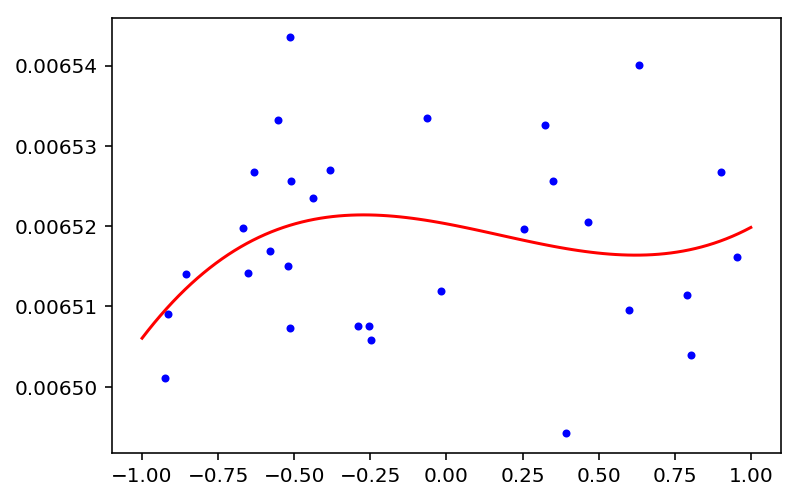

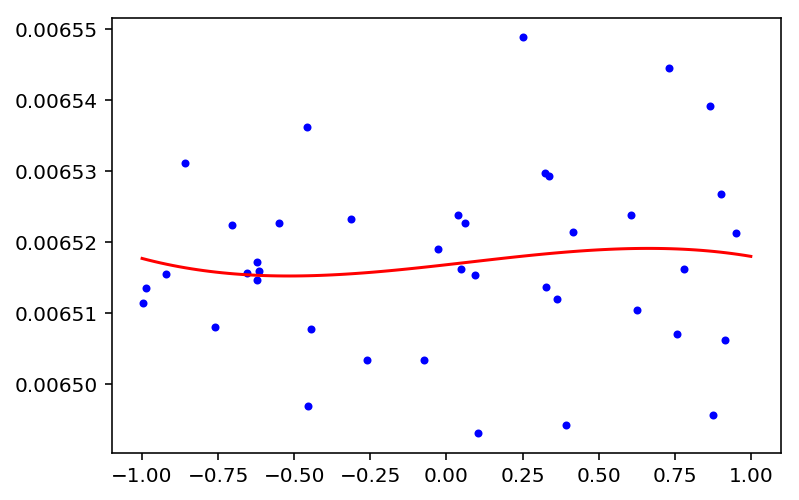

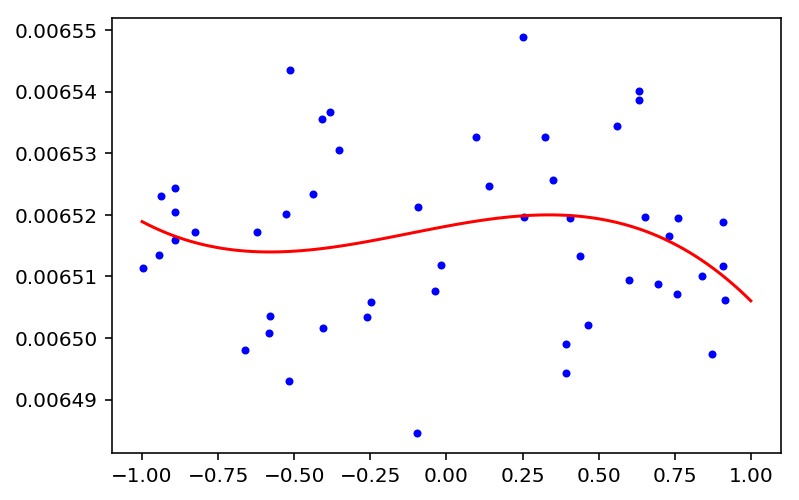

...

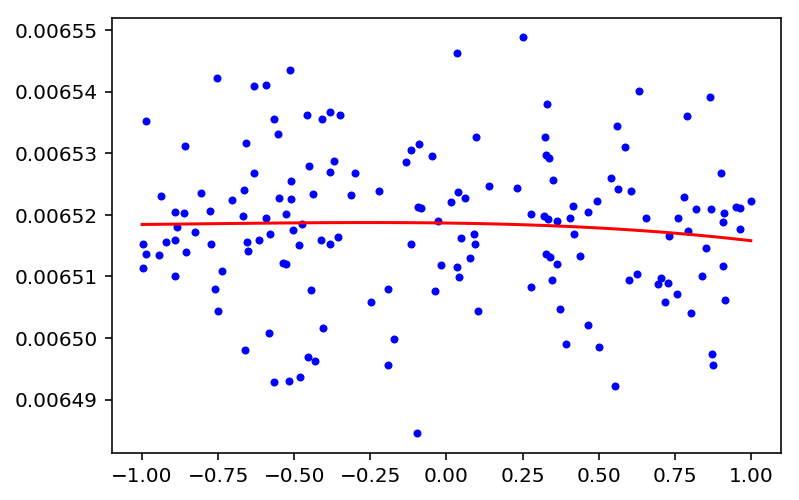

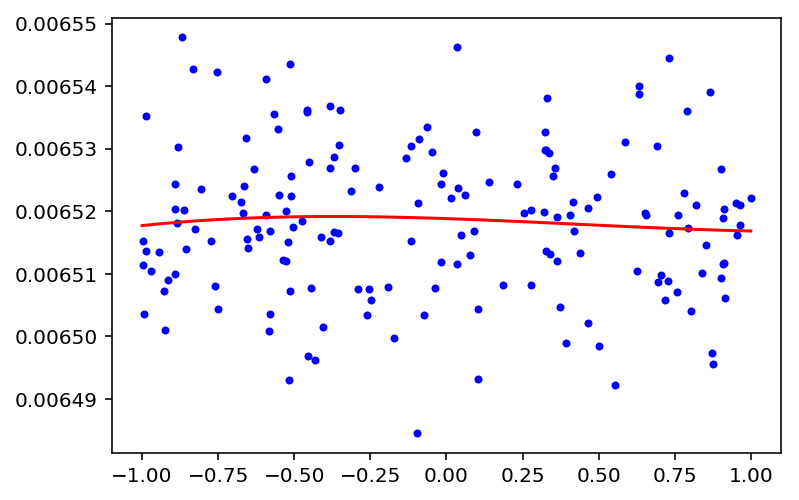

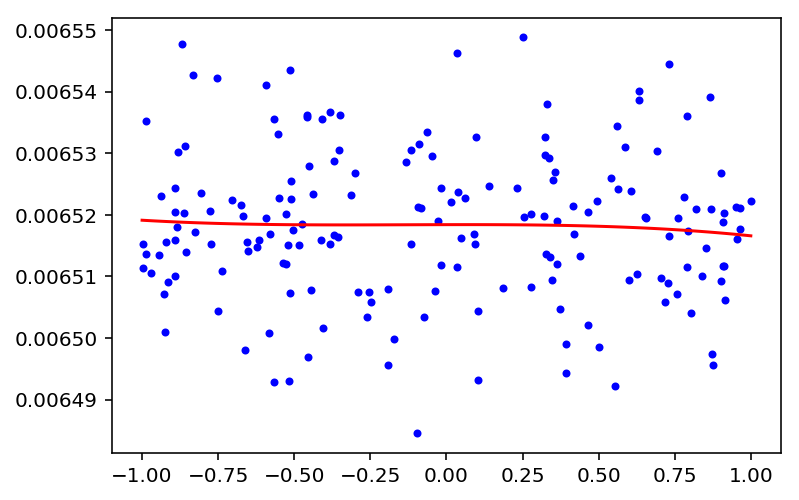

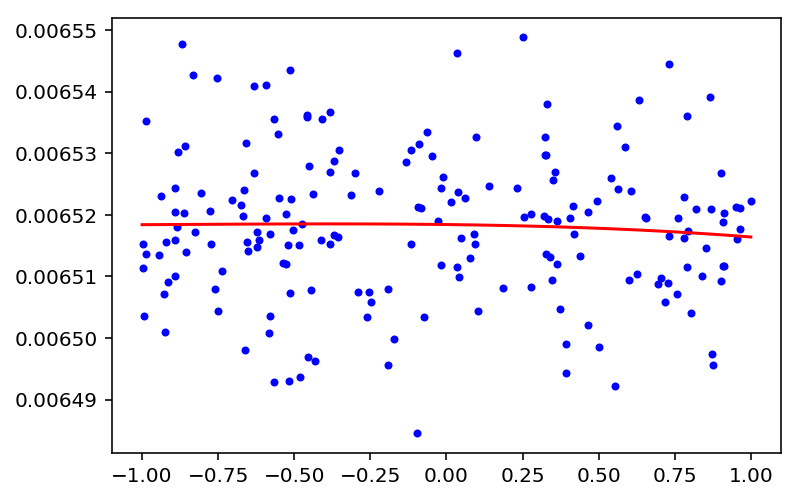

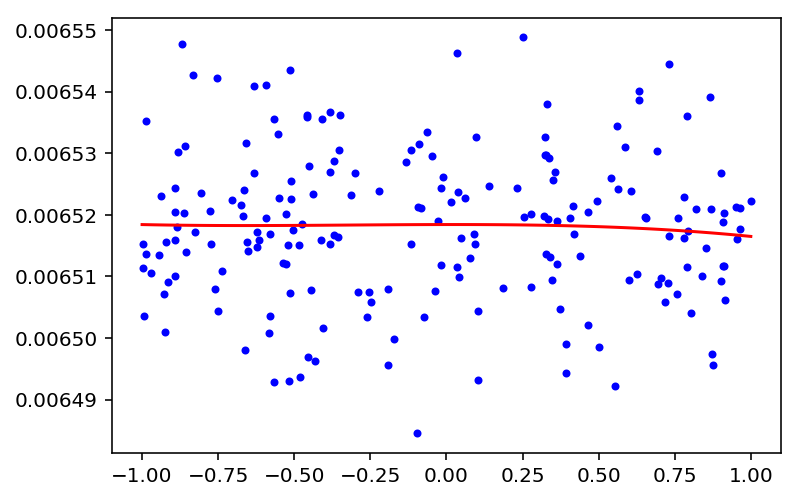

In [96]:
poly_deriv_Acen = []
for i in range(20):
    idx = np.random.choice(200,(10+10*i),replace=0)+1000
    param_i = data['param'][idx,5]
    func_i = data['func_all'][idx,0]
    poly_deriv_Acen.append(fit_poly_derivative_Acen(param_i,func_i)[0])

In [97]:
def fit_line_derivative_Acen(param,func):
    a,b = np.polyfit(param,func,1)
    plt.figure()
    plt.plot(param,func,'b.')
    plt.plot(np.linspace(-0.05,0.05,100),np.linspace(-0.05,0.05,100)*a+b,'r-')
    return a,b

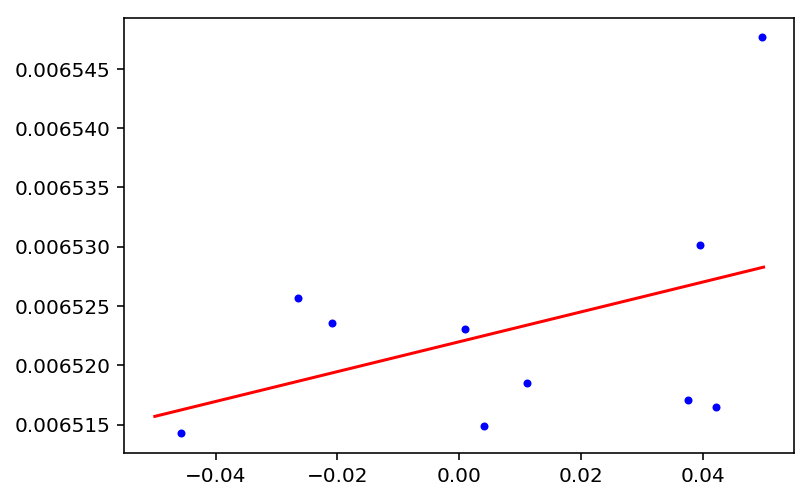

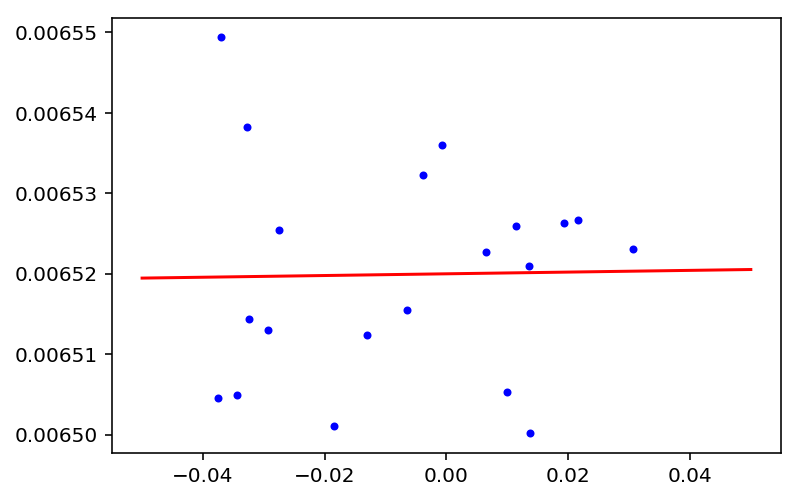

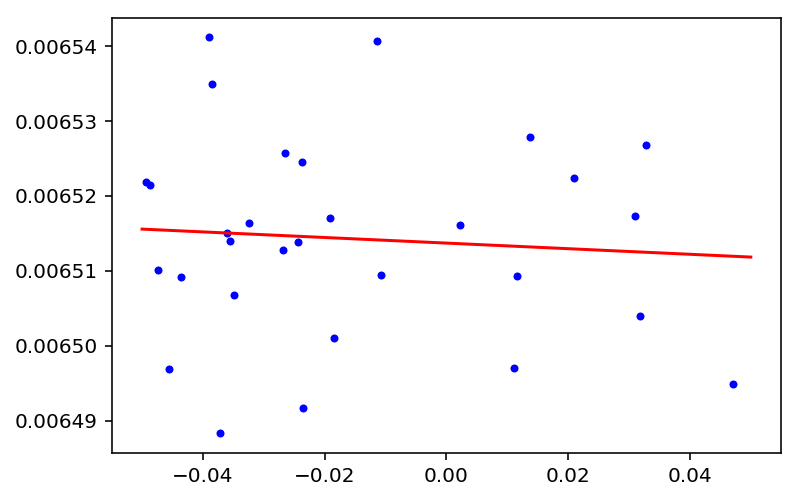

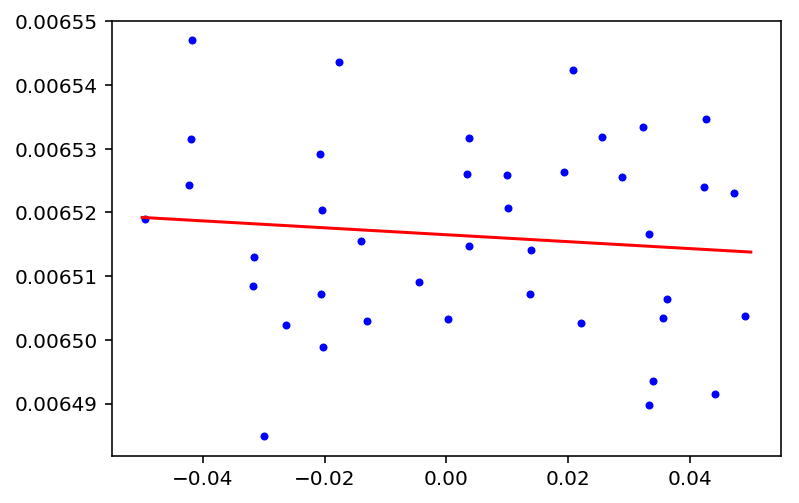

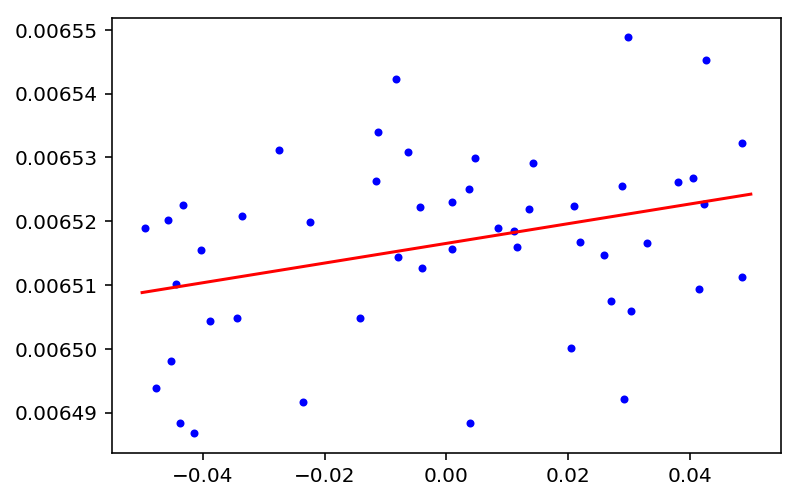

...

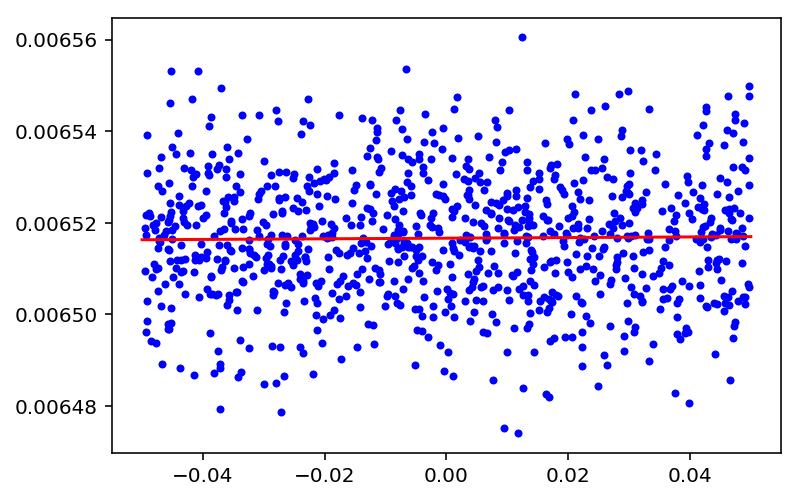

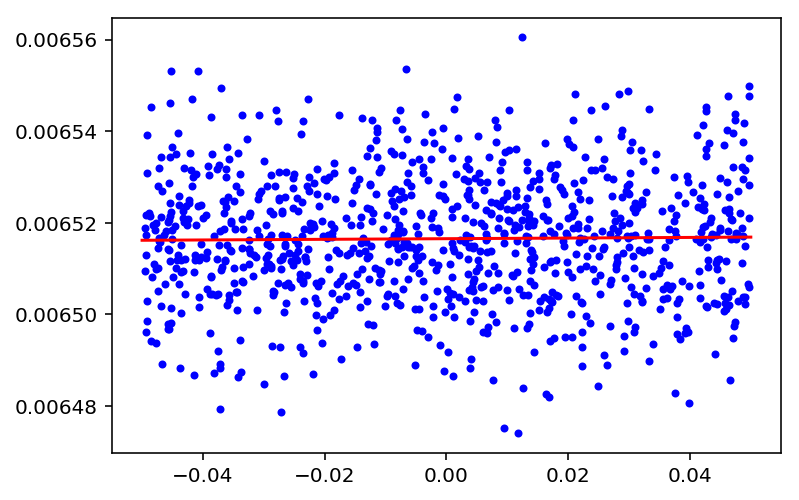

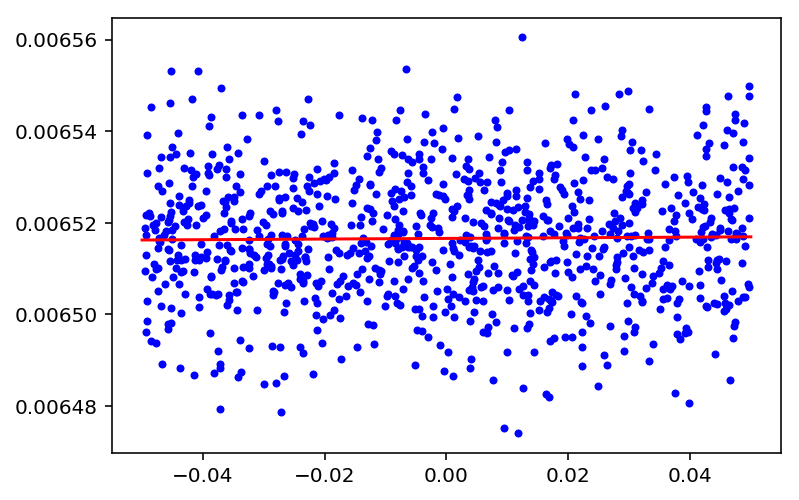

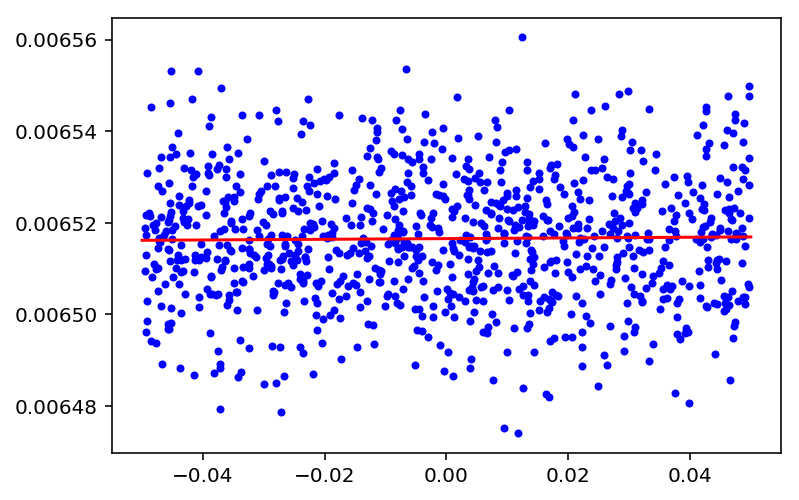

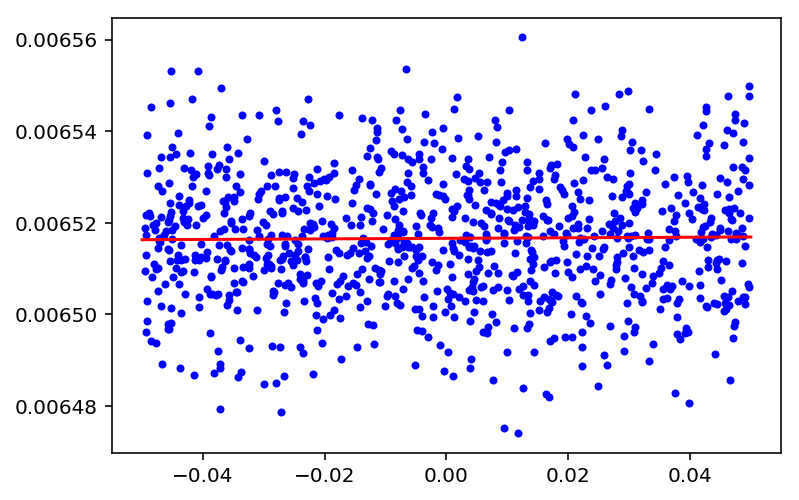

In [103]:
line_deriv_Acen = []
for i in range(100):
    idx = np.random.choice(1000,(10+10*i),replace=0)+5000
    param_i = narrow['param'][idx,5]
    func_i = narrow['func_all'][idx,0]
    line_deriv_Acen.append(fit_line_derivative_Acen(param_i,func_i)[0])

In [89]:
Acen = []
ngal = []
for i in range(100):
    print i
    Aceni = Acen_0+np.random.random()*2-1
    Acen.append(Aceni)
    model.param_dict['mean_occupation_centrals_assembias_param1'] = Aceni
    ngal.append((np.sum(model.mean_occupation_centrals(table=model.mock.halo_table))+\
                np.sum(model.mean_occupation_satellites(table=model.mock.halo_table)))/(250.**3))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


In [90]:
Acen_l = []
ngal_l = []
for i in range(100):
    print i
    Aceni = Acen_0+np.random.random()*0.1-0.05
    Acen_l.append(Aceni)
    model.param_dict['mean_occupation_centrals_assembias_param1'] = Aceni
    ngal_l.append((np.sum(model.mean_occupation_centrals(table=model.mock.halo_table))+\
                np.sum(model.mean_occupation_satellites(table=model.mock.halo_table)))/(250.**3))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


-7.29711744937e-07


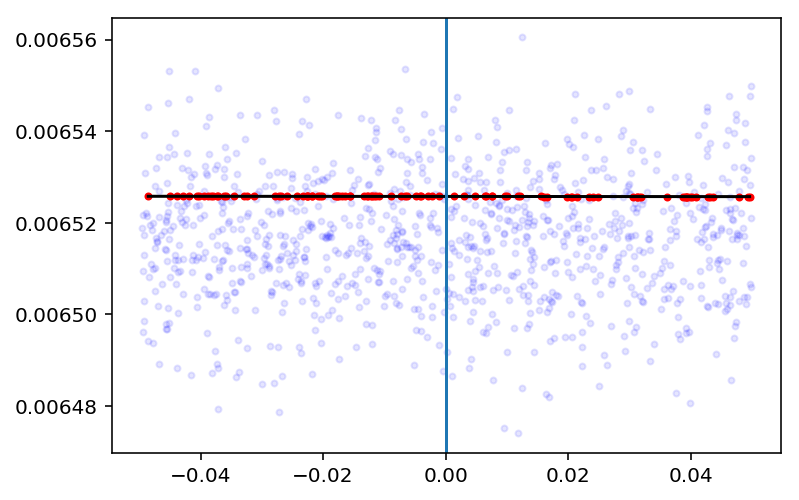

In [92]:
plt.plot(narrow['param'][5000:6000,5],narrow['func_all'][5000:6000,0],'b.',alpha=0.1)
plt.plot(Acen_l,ngal_l,'r.')
A,B = np.polyfit(Acen_l,ngal_l,1)
plt.plot(np.sort(Acen_l),np.sort(np.array(Acen_l))*A+B,'k-')
print A
plt.axvline(Acen_0)

-7.28541310346e-07


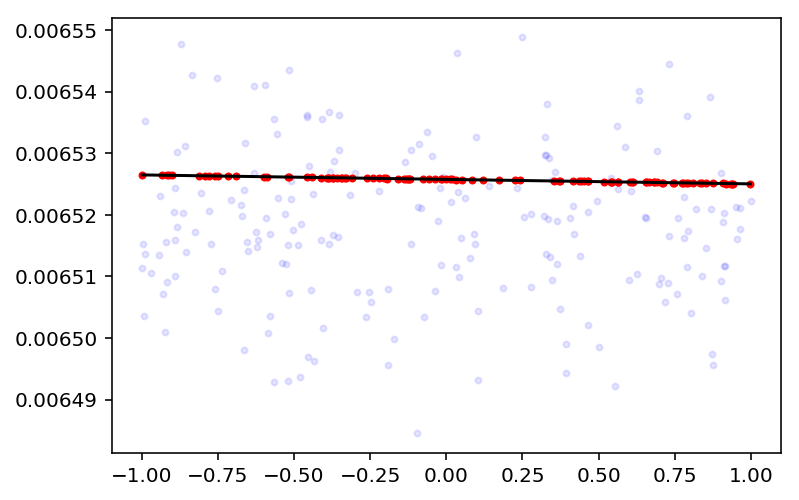

In [93]:
plt.plot(data['param'][1000:1200,5],data['func_all'][1000:1200,0],'b.',alpha=0.1)
plt.plot(Acen,ngal,'r.')
a,b,c,d = np.polyfit(Acen,ngal,3)
plt.plot(np.sort(Acen),poly(np.sort(np.array(Acen)),a,b,c,d),'k-')
print 3*a*Acen_0**2+2*b*Acen_0+c

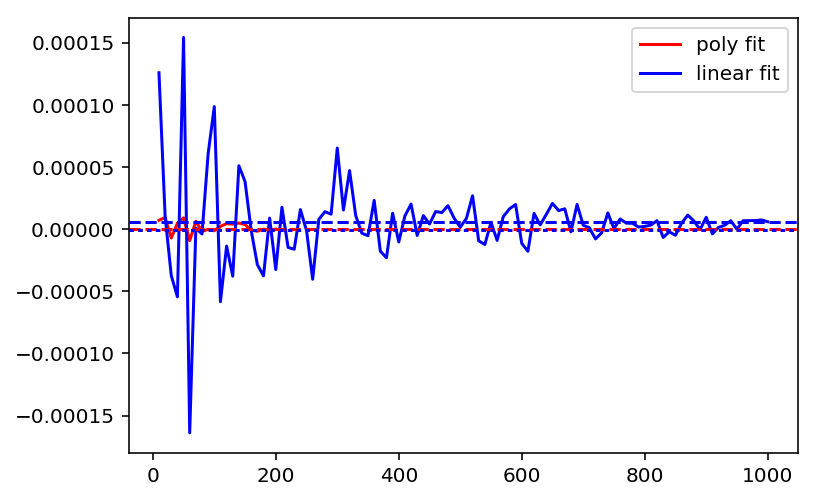

In [104]:
plt.plot(np.arange(1,21)*10,poly_deriv_Acen,'r',label='poly fit')
plt.plot(np.arange(1,101)*10,line_deriv_Acen,'b',label='linear fit')
plt.axhline(poly_deriv_Acen[-1],linestyle='--',c='r')
plt.axhline(line_deriv_Acen[-1],linestyle='--',c='b')
plt.axhline(-7.28541310346e-07,linestyle=':',c='r')
plt.axhline(-7.29711744937e-07,linestyle=':',c='b')
plt.legend()
#plt.ylim((0.0002,0.0004))